# Vehicle Detection Demo
Welcome to the object detection inference walkthrough!  This notebook will walk you step by step through the process of using a pre-trained model to detect objects in an image. Make sure to follow the [installation instructions](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/installation.md) before you start.

**This notebook is based on the object_detection_tutorial.ipynb**

# Imports

In [1]:
import numpy as np
import os
import sys
import tarfile
import tensorflow as tf
import zipfile
from io import StringIO
from matplotlib import pyplot as plt

"""
Six: Python 2 and 3 Compatibility Library

Six provides simple utilities for wrapping over differences between Python 2 
and Python 3. It is intended to support codebases that work on both Python 2 
and 3 without modification. six consists of only one Python file, so it is
painless to copy into a project.

http://pythonhosted.org/six/

Python 3 reorganized the standard library and moved several functions to 
different modules. Six provides a consistent interface to them through the 
fake six.moves module. For example, to load the module for parsing HTML on 
Python 2 or 3, write:

from six.moves import html_parser

Similarly, to get the function to reload modules, which was moved from the 
builtin module to the imp module, use:

from six.moves import reload_module
"""
import six.moves.urllib as urllib

"""
collections — High-performance container datatypes

This module implements specialized container datatypes providing alternatives 
to Python’s general purpose built-in containers, dict, list, set, and tuple.

https://docs.python.org/2/library/collections.html
"""
from collections import defaultdict

"""
The Python Imaging Library adds image processing capabilities to your Python interpreter.

https://pillow.readthedocs.io/en/4.3.x/index.html
"""
from PIL import Image

if tf.__version__ != '1.4.0':
  raise ImportError('Please upgrade your tensorflow installation to v1.4.0!')


/usr/local/lib/python2.7/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


## Env setup

In [2]:
# This is needed to display the images.
%matplotlib inline

# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("..")

## Object detection imports
Here are the imports from the object detection module.

In [25]:
from utils import label_map_util

from utils import visualization_utils as vis_util

# Model preparation 

## Variables

Any model exported using the `export_inference_graph.py` tool can be loaded here simply by changing `PATH_TO_CKPT` to point to a new .pb file.  

By default we use an "SSD with Mobilenet" model here. See the [detection model zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md) for a list of other models that can be run out-of-the-box with varying speeds and accuracies.

In [32]:
# What model to download.
#MODEL_NAME = 'ssd_mobilenet_v1_coco_2017_11_17'

MODEL_NAME = 'faster_rcnn_inception_resnet_v2_atrous_coco_2017_11_08'

MODEL_FILE = MODEL_NAME + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'

# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = MODEL_NAME + '/frozen_inference_graph.pb'

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = os.path.join('data', 'mscoco_label_map.pbtxt')

NUM_CLASSES = 200

## Download Model

In [33]:
opener = urllib.request.URLopener()
opener.retrieve(DOWNLOAD_BASE + MODEL_FILE, MODEL_FILE)
tar_file = tarfile.open(MODEL_FILE)
for file in tar_file.getmembers():
  file_name = os.path.basename(file.name)
  if 'frozen_inference_graph.pb' in file_name:
    tar_file.extract(file, os.getcwd())

## Load a (frozen) Tensorflow model into memory.

In [34]:
detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

## Loading label map
Label maps map indices to category names, so that when our convolution network predicts `5`, we know that this corresponds to `airplane`.  Here we use internal utility functions, but anything that returns a dictionary mapping integers to appropriate string labels would be fine

In [29]:
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

## Helper code

In [8]:
def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

# Detection

In [20]:
# For the sake of simplicity we will use only 2 images:
# image1.jpg
# image2.jpg
# If you want to test the code with your images, just add path to the images to the TEST_IMAGE_PATHS.
PATH_TO_TEST_IMAGES_DIR = 'vehicle_images'
TEST_IMAGE_PATHS = [ 
    #PATH_TO_TEST_IMAGES_DIR + '/image1.jpg',
    PATH_TO_TEST_IMAGES_DIR + '/image2.jpg'
    #PATH_TO_TEST_IMAGES_DIR + '/image3.jpg'
]

# Size, in inches, of the output images.
IMAGE_SIZE = (2048, 2048)

In [21]:
print TEST_IMAGE_PATHS
print IMAGE_SIZE

['vehicle_images/image2.jpg']
(2048, 2048)


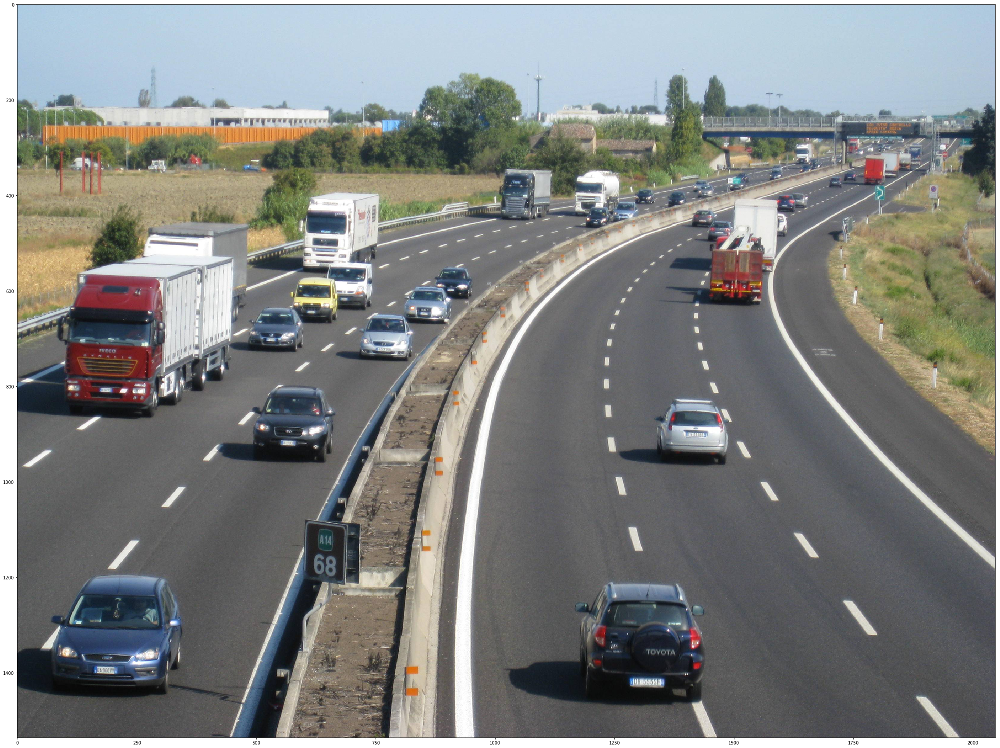

In [22]:
image = Image.open(TEST_IMAGE_PATHS[0])
image.thumbnail(IMAGE_SIZE, Image.ANTIALIAS)
plt.figure(figsize=(40,40))
plt.imshow(image)
#plt.savefig(PATH_TO_TEST_IMAGES_DIR + '/image2bis.png')
#image_np=load_image_into_numpy_array(image)
#plt.imshow(image_np)

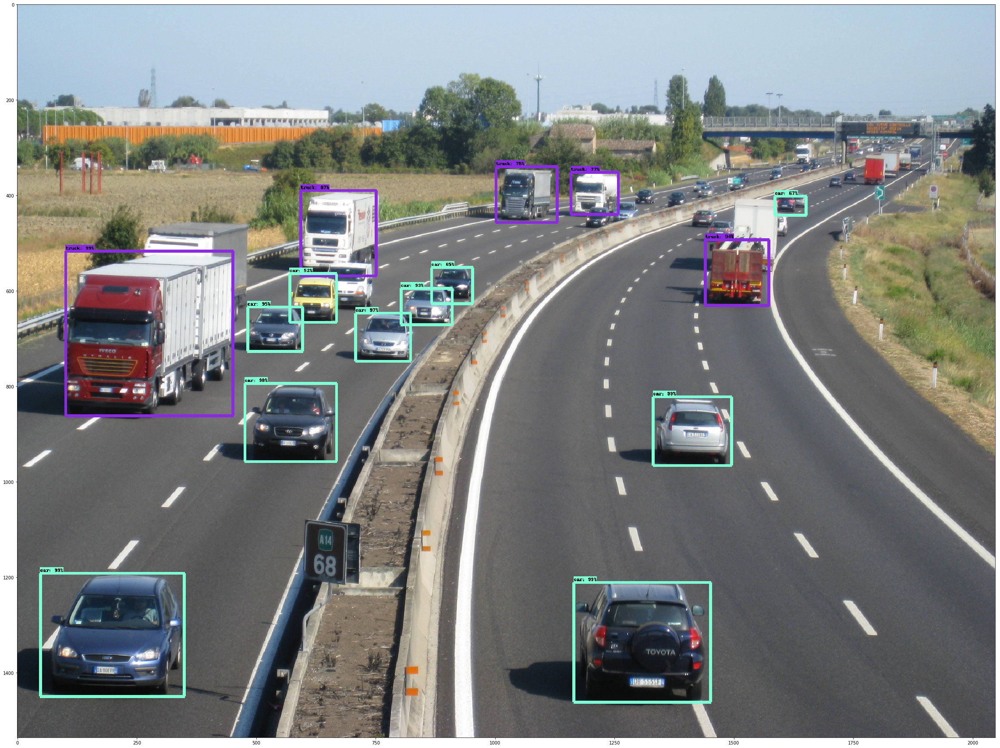

In [35]:
with detection_graph.as_default():
  with tf.Session(graph=detection_graph) as sess:
    # Definite input and output Tensors for detection_graph
    image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
    # Each box represents a part of the image where a particular object was detected.
    detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
    # Each score represent how level of confidence for each of the objects.
    # Score is shown on the result image, together with the class label.
    detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
    detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
    num_detections = detection_graph.get_tensor_by_name('num_detections:0')
    for image_path in TEST_IMAGE_PATHS:
      image = Image.open(image_path)
      image.thumbnail(IMAGE_SIZE, Image.ANTIALIAS)
      # the array based representation of the image will be used later in order to prepare the
      # result image with boxes and labels on it.
      image_np = load_image_into_numpy_array(image)
      # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
      image_np_expanded = np.expand_dims(image_np, axis=0)
      # Actual detection.
      (boxes, scores, classes, num) = sess.run(
          [detection_boxes, detection_scores, detection_classes, num_detections],
          feed_dict={image_tensor: image_np_expanded})
      # Visualization of the results of a detection.
      vis_util.visualize_boxes_and_labels_on_image_array(
          image_np,
          np.squeeze(boxes),
          np.squeeze(classes).astype(np.int32),
          np.squeeze(scores),
          category_index,
          use_normalized_coordinates=True,
          line_thickness=6)
      plt.figure(figsize=(40,40))
      plt.imshow(image_np)